README:
Based off the 'sput_es_nar_N_S_America_geojson.ipynb'. The raw data was processed on Palmetto using the 'sput_es_nar_S_Amercia_geojson.ipynb' the output file was downloaded from palmetto 'sput_es_nar_counts_S_america.csv'. Process Twitter user_reported_location data and generate static and animated maps. 

In [2]:
import sys
!{sys.executable} -m pip install seaborn

You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


In [11]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import pandas as pd
import pycountry
import plotly.express as px
import psutil
import plotly.graph_objects as go
import json

In [2]:
#Set Working Directory Palmetto
#os.chdir('/home/whitedl/Carnegie/')

In [3]:
#Set Working Directory - work mac
#os.chdir('/Users/admin/Box/Default Sync Folder/Projects/Media_Forensics/Projects/Carnegie/whitedl/narratives/sput_nar/')

In [ ]:
df = pd.read_json('sput_es_nar.json')
#df = json.load(open('ru_narratives_Jun10_30_21_full.json', 'r'))

In [6]:
df.head()

,created_at,id_str,REGION,POST_TYPE,entities.hashtags,retweeted_status.user.id_str,retweeted_status.id_str,retweeted_status.full_text,source,text,...,user.listed_count,user.location,user.name,user.screen_name,user.statuses_count,user.verified,lang,quoted_status.id_str,rt,act
0,2020-08-13 19:19:04+00:00,1293990470771707904,Unknown,RETWEET,"[{'text': 'SputnikV', 'indices': [20, 29]}]",1242478224925265921,1293849784155955200,"#SputnikV, otro salto tecnológico ruso\nInfórm...","<a href=""http://twitter.com/download/android"" ...","#SputnikV, otro salto tecnológico ruso\nInfórm...",...,2,,lorena garcia,lorenag12139687,95933,0,es,None,False,False
1,2020-08-13 12:49:45+00:00,1293892496918020096,Cuba,RETWEET,"[{'text': 'SputnikV', 'indices': [20, 29]}]",1242478224925265921,1293849784155955200,"#SputnikV, otro salto tecnológico ruso\nInfórm...","<a href=""https://mobile.twitter.com"" rel=""nofo...","#SputnikV, otro salto tecnológico ruso\nInfórm...",...,1,"La Habana, Cuba",oscar redondo,oscaredondo,23009,0,es,None,False,False
2,2020-08-13 17:22:20+00:00,1293961094457942016,United States,RETWEET,"[{'text': 'SputnikV', 'indices': [20, 29]}]",1242478224925265921,1293849784155955200,"#SputnikV, otro salto tecnológico ruso\nInfórm...","<a href=""https://mobile.twitter.com"" rel=""nofo...","#SputnikV, otro salto tecnológico ruso\nInfórm...",...,12,Ciudad Autónoma Buenos Aires,Maylin Vidal,maylinv,21569,0,es,None,False,False
3,2020-08-13 16:31:32+00:00,1293948313503375360,Mexico,RETWEET,"[{'text': 'SputnikV', 'indices': [20, 29]}]",1242478224925265921,1293849784155955200,"#SputnikV, otro salto tecnológico ruso\nInfórm...","<a href=""http://twitter.com/download/android"" ...","#SputnikV, otro salto tecnológico ruso\nInfórm...",...,0,"Distrito Federal, México",Luis Manuel,LuisMan11261818,3255,0,es,None,False,False
4,2020-08-13 10:00:01+00:00,1293849784155955200,Unknown,None,"[{'text': 'SputnikV', 'indices': [0, 9]}]",None,None,None,"<a href=""https://about.twitter.com/products/tw...","#SputnikV, otro salto tecnológico ruso\nInfórm...",...,64,,PL Agencia Prensa Latina,PLprensalatina,22512,0,es,None,False,False


In [ ]:
df.rename(columns={'REGION': 'country'}, inplace=True)

df.info()

In [10]:

#CleanUp
# Remove NAs
df = df.dropna(subset=['country'], axis=0)

# Creates a subset 
df = df.query("country !='Unknown'or country !=''")

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3949932 entries, 0 to 3949931
Data columns (total 28 columns):
 #   Column                        Dtype              
---  ------                        -----              
 0   created_at                    datetime64[ns, UTC]
 1   id_str                        int64              
 2   country                       object             
 3   POST_TYPE                     object             
 4   entities.hashtags             object             
 5   retweeted_status.user.id_str  object             
 6   retweeted_status.id_str       object             
 7   retweeted_status.full_text    object             
 8   source                        object             
 9   text                          object             
 10  user.created_at               int64              
 11  user.default_profile_image    int64              
 12  user.description              object             
 13  user.favourites_count         int64              
 14  us

In [12]:
#Create a new column for date and convert the twitter created_at to date-time and convert to month-year
#df['date']  = pd.to_datetime(df.PUBLISH_DATE, format='%m/%d/%Y %H:%M:%S').dt.strftime('%m-%d-%Y')
df['date']  = pd.to_datetime(df.created_at, format='%m/%d/%Y %H:%M:%S')

In [ ]:
df.info()

In [14]:
#Subset data 
df_subset = df[['country','date']].sort_values(by=['country','date'])
df_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3949932 entries, 14712 to 2417859
Data columns (total 2 columns):
 #   Column   Dtype              
---  ------   -----              
 0   country  object             
 1   date     datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1), object(1)
memory usage: 90.4+ MB


In [15]:
df_subset.head()

,country,date
14712,Afghanistan,2020-08-12 01:49:42+00:00
4185,Afghanistan,2020-08-13 06:33:53+00:00
221683,Afghanistan,2020-08-15 02:43:07+00:00
203207,Afghanistan,2020-08-21 03:32:19+00:00
87379,Afghanistan,2020-10-03 04:39:15+00:00


In [16]:
#Add new column the period of a month in %Y-%m format
df_subset['date_M']=pd.DatetimeIndex(df_subset['date']).to_period(freq = 'M')
df_subset.head()

/home/whitedl/.local/lib/python3.8/site-packages/pandas/core/arrays/datetimes.py:1143: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  warnings.warn(


,country,date,date_M
14712,Afghanistan,2020-08-12 01:49:42+00:00,2020-08
4185,Afghanistan,2020-08-13 06:33:53+00:00,2020-08
221683,Afghanistan,2020-08-15 02:43:07+00:00,2020-08
203207,Afghanistan,2020-08-21 03:32:19+00:00,2020-08
87379,Afghanistan,2020-10-03 04:39:15+00:00,2020-10


In [17]:
#Create a new datetime for that calculate the end of the month for each montly observation period
df_subset['date_t']=df_subset['date_M'].dt.end_time
df_subset.head()

,country,date,date_M,date_t
14712,Afghanistan,2020-08-12 01:49:42+00:00,2020-08,2020-08-31 23:59:59.999999999
4185,Afghanistan,2020-08-13 06:33:53+00:00,2020-08,2020-08-31 23:59:59.999999999
221683,Afghanistan,2020-08-15 02:43:07+00:00,2020-08,2020-08-31 23:59:59.999999999
203207,Afghanistan,2020-08-21 03:32:19+00:00,2020-08,2020-08-31 23:59:59.999999999
87379,Afghanistan,2020-10-03 04:39:15+00:00,2020-10,2020-10-31 23:59:59.999999999


In [18]:
#Convert datetime to a string so that plotly can use it in the slider
df_subset['date_t'] = pd.to_datetime(df_subset['date_t']).dt.date.astype('str')
df_subset.head()

,country,date,date_M,date_t
14712,Afghanistan,2020-08-12 01:49:42+00:00,2020-08,2020-08-31
4185,Afghanistan,2020-08-13 06:33:53+00:00,2020-08,2020-08-31
221683,Afghanistan,2020-08-15 02:43:07+00:00,2020-08,2020-08-31
203207,Afghanistan,2020-08-21 03:32:19+00:00,2020-08,2020-08-31
87379,Afghanistan,2020-10-03 04:39:15+00:00,2020-10,2020-10-31


In [19]:
# Resample to monthly sum and save as new dataframe
df_count = df_subset.groupby(['date_t','country','date_M'], as_index=False).count()

df_count.head()

,date_t,country,date_M,date
0,2020-08-31,Afghanistan,2020-08,4
1,2020-08-31,Andorra,2020-08,2
2,2020-08-31,Angola,2020-08,2
3,2020-08-31,Antarctica,2020-08,1
4,2020-08-31,Argentina,2020-08,2237


In [20]:
#Rename column to count
df_count.rename(columns={'date': 'count'}, inplace=True)
#Subset data 
df_map = df_count[['country','date_t','count','date_M']].sort_values(by=['country','date_M'])
df_map.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1622 entries, 0 to 1077
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype    
---  ------   --------------  -----    
 0   country  1622 non-null   object   
 1   date_t   1622 non-null   object   
 2   count    1622 non-null   int64    
 3   date_M   1622 non-null   period[M]
dtypes: int64(1), object(2), period[M](1)
memory usage: 63.4+ KB


In [21]:
df_map.head()

,country,date_t,count,date_M
0,Afghanistan,2020-08-31,4,2020-08
183,Afghanistan,2020-10-31,2,2020-10
277,Afghanistan,2020-11-30,10,2020-11
377,Afghanistan,2020-12-31,43,2020-12
509,Afghanistan,2021-01-31,14,2021-01


In [22]:
#Builds a Data Frame to remove a list of countries
Country_keep = {'country':  
['Mexico',
 'Haiti',
 'Dominican Republic',
 'Honduras',                            
 'Argentina',
 'Bolivia',
 'Brazil',
 'Chile',
 'Colombia',
 'Ecuador',
 'French Guiana',
 'Guyana',
 'Paraguay',
 'Peru',
 'Suriname',
 'Uruguay',
 'Venezuela',
 'Belize',
 'Costa Rica',
 'El Salvador',
 'Guatemala',
 'Honduras',
 'Nicaragua',
 'Panama']}

Country_keep = pd.DataFrame(Country_keep, columns = ['country'])
Country_keep

,country
0,Mexico
1,Haiti
2,Dominican Republic
3,Honduras
4,Argentina
5,Bolivia
6,Brazil
7,Chile
8,Colombia
9,Ecuador


In [23]:
#Remove identified countries
df_map = df_map[df_map['country'].isin(Country_keep['country'])]

In [24]:
#Dealing with the SORT issue
df_map.reset_index(drop = True, inplace = True)
df_map.set_index('date_M')
df_map = df_map.sort_values(by=['date_M'])

In [25]:
df_map.head(10)

,country,date_t,count,date_M
0,Argentina,2020-08-31,2237,2020-08
107,Ecuador,2020-08-31,2046,2020-08
79,Costa Rica,2020-08-31,111,2020-08
121,El Salvador,2020-08-31,326,2020-08
135,Guatemala,2020-08-31,550,2020-08
65,Colombia,2020-08-31,1965,2020-08
162,Honduras,2020-08-31,179,2020-08
176,Mexico,2020-08-31,5423,2020-08
51,Chile,2020-08-31,1024,2020-08
190,Nicaragua,2020-08-31,607,2020-08


In [26]:
#Univariate Stats
df_map.describe()

,count
count,280.000000
mean,5209.089286
std,14368.093962
min,1.000000
25%,137.000000
50%,700.500000
75%,2846.000000
max,93852.000000


In [27]:
#Checking how many count values are under 5
df_map[df_map['count'] <= 5 ]

,country,date_t,count,date_M
246,Suriname,2020-08-31,1,2020-08
14,Belize,2020-08-31,1,2020-08
151,Haiti,2020-09-30,1,2020-09
247,Suriname,2020-10-31,2,2020-10
15,Belize,2020-10-31,2,2020-10
152,Haiti,2020-11-30,1,2020-11
153,Haiti,2020-12-31,1,2020-12
248,Suriname,2020-12-31,4,2020-12
16,Belize,2020-12-31,1,2020-12
154,Haiti,2021-01-31,1,2021-01


In [28]:
#Filter value counts of less than 5
df_map = df_map.query('count > 5')

In [29]:
#Did the filter work?
df_map[df_map['count'] <= 5 ]

,country,date_t,count,date_M


In [31]:
# ----------- Step 2 ------------
list_countries = df_map['country'].unique().tolist()
print(list_countries) # Uncomment to see list of countries
d_country_code = {}  # To hold the country names and their ISO
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)
        # If could not find country, make ISO code ' '
        d_country_code.update({country: ' '})

print(d_country_code) # Uncomment to check dictionary  

['Argentina', 'Ecuador', 'Costa Rica', 'El Salvador', 'Guatemala', 'Colombia', 'Honduras', 'Mexico', 'Chile', 'Nicaragua', 'Panama', 'Brazil', 'Paraguay', 'Peru', 'Bolivia', 'Dominican Republic', 'Venezuela', 'Uruguay', 'Suriname']
{'Argentina': 'ARG', 'Ecuador': 'ECU', 'Costa Rica': 'CRI', 'El Salvador': 'SLV', 'Guatemala': 'GTM', 'Colombia': 'COL', 'Honduras': 'HND', 'Mexico': 'MEX', 'Chile': 'CHL', 'Nicaragua': 'NIC', 'Panama': 'PAN', 'Brazil': 'BRA', 'Paraguay': 'PRY', 'Peru': 'PER', 'Bolivia': 'BOL', 'Dominican Republic': 'DOM', 'Venezuela': 'VEN', 'Uruguay': 'URY', 'Suriname': 'SUR'}


In [32]:
# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code.items():
    df_map.loc[(df_map.country == k), 'iso_a3'] = v

print(df_map.head)  # Uncomment to confirm that ISO codes added

<bound method NDFrame.head of          country      date_t  count   date_M iso_a3
0      Argentina  2020-08-31   2237  2020-08    ARG
107      Ecuador  2020-08-31   2046  2020-08    ECU
79    Costa Rica  2020-08-31    111  2020-08    CRI
121  El Salvador  2020-08-31    326  2020-08    SLV
135    Guatemala  2020-08-31    550  2020-08    GTM
..           ...         ...    ...      ...    ...
203    Nicaragua  2021-09-30   1231  2021-09    NIC
36       Bolivia  2021-09-30    760  2021-09    BOL
231     Paraguay  2021-09-30    810  2021-09    PRY
13     Argentina  2021-09-30   7003  2021-09    ARG
279    Venezuela  2021-09-30  16251  2021-09    VEN

[252 rows x 5 columns]>


In [33]:
df_map.head()

,country,date_t,count,date_M,iso_a3
0,Argentina,2020-08-31,2237,2020-08,ARG
107,Ecuador,2020-08-31,2046,2020-08,ECU
79,Costa Rica,2020-08-31,111,2020-08,CRI
121,El Salvador,2020-08-31,326,2020-08,SLV
135,Guatemala,2020-08-31,550,2020-08,GTM


In [ ]:
#Export the file to CSV
df_map.to_csv(r'sput_es_nar_counts_S_america.csv')

In [13]:
#Open the file export
df_map = pd.read_csv('sput_es_nar_counts_S_america.csv')
df_map.info

<bound method DataFrame.info of      Unnamed: 0      country      date_t  count   date_M iso_a3
0             0    Argentina  2020-08-31   2237  2020-08    ARG
1           107      Ecuador  2020-08-31   2046  2020-08    ECU
2            79   Costa Rica  2020-08-31    111  2020-08    CRI
3           121  El Salvador  2020-08-31    326  2020-08    SLV
4           135    Guatemala  2020-08-31    550  2020-08    GTM
..          ...          ...         ...    ...      ...    ...
247         203    Nicaragua  2021-09-30   1231  2021-09    NIC
248          36      Bolivia  2021-09-30    760  2021-09    BOL
249         231     Paraguay  2021-09-30    810  2021-09    PRY
250          13    Argentina  2021-09-30   7003  2021-09    ARG
251         279    Venezuela  2021-09-30  16251  2021-09    VEN

[252 rows x 6 columns]>

In [17]:
df_map.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  252 non-null    int64 
 1   country     252 non-null    object
 2   date_t      252 non-null    object
 3   count       252 non-null    int64 
 4   date_M      252 non-null    object
 5   iso_a3      252 non-null    object
dtypes: int64(2), object(4)
memory usage: 11.9+ KB


In [20]:
#Mean calculation for counts
sput_es_nar_counts_S_america_sum = df_map.groupby(['country','iso_a3'])['count'].sum().reset_index()
sput_es_nar_counts_S_america_sum.to_csv('sput_es_nar_counts_S_america_sum.csv')

In [98]:
# assign mp to the geojson data
# GeoJson generator is here. https://geojson-maps.ash.ms
import json
with open("/Users/davidwhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/Carnegie/whitedl/narratives/S_america.geo.json", "r") as geo:
      mp_1 = json.load(geo)
#mp_1["features"][2]

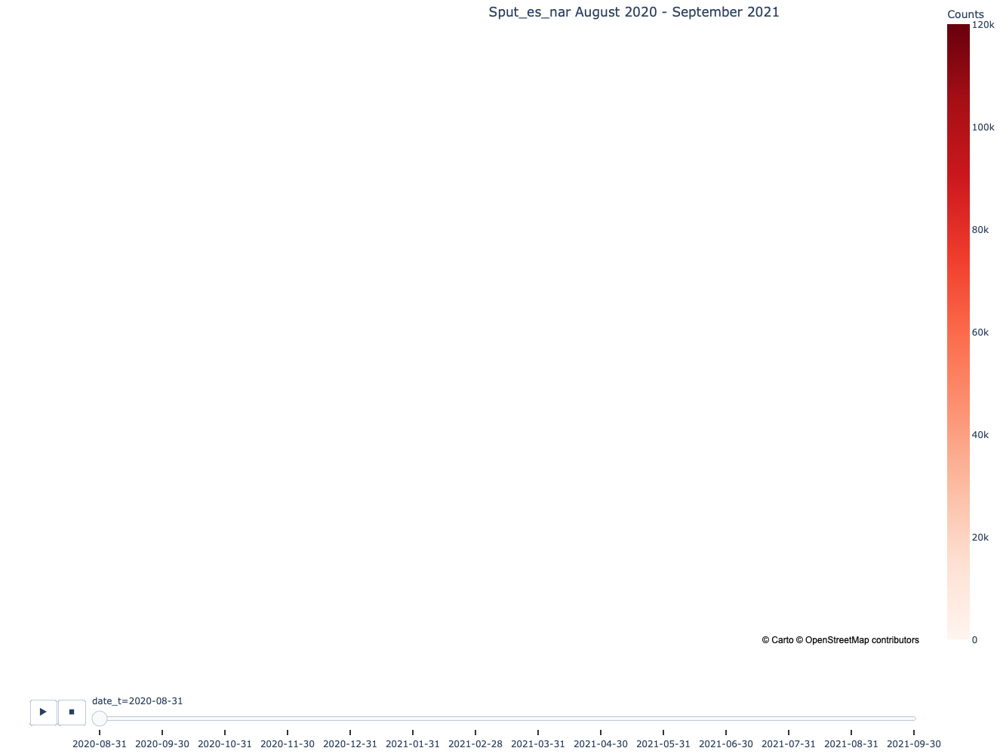

In [101]:
import plotly.express as px

fig = px.choropleth_mapbox(df_map, geojson=mp_1, locations='iso_a3', color='count',
                           color_continuous_scale="reds",
                           #range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=1.75, center = {"lat": 10, "lon": -80},
                           labels={'count':'Counts'},
                           range_color=(0, 120000),
                           animation_frame="date_t",
                           featureidkey="properties.iso_a3"
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                 autosize=False,
                 width=600,
                 height=1000,
                  title = {
                    'text': 'Sput_es_nar August 2020 - September 2021',
                    'y':0.99,
                    'x':0.78,
                    'xanchor': 'right',
                    'yanchor': 'top'}
                 )

#fig.update_layout(margin=dict(l=20, r=300, t=20, b=200),paper_bgcolor="LightSteelBlue")
fig.show()
fig.write_html("sput_es_nar_counts_N_S_america.html")

In [102]:
#Reads the Normalized Tweet Data and imports for further processing - apartment-imac
#df_twit_reach = pd.read_csv('/Users/anticolewhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/Carnegie/whitedl/sputnik_all/twitter_reach/twitter_reach_country_edit_sput_all.csv', engine='python')
#Reads the Normalized Tweet Data and imports for further processing - house-imace
df_twit_reach = pd.read_csv('/Users/davidwhite/Box Sync/Default Sync Folder/Projects/Media_Forensics/Projects/Carnegie/whitedl/sputnik_all/twitter_reach/twitter_reach_country_edit_sput_all.csv', engine='python')
df_twit_reach.head()
print(df_twit_reach)

         country  potential_twitter_reach
0    Afghanistan                   127600
1        Albania                    65200
2        Algeria                   625200
3         Angola                    26400
4       Anguilla                     1150
..           ...                      ...
134      Uruguay                   489600
135   Uzbekistan                    51600
136    Venezuela                  1350000
137     Viet Nam                  1250000
138     Zimbabwe                   172800

[139 rows x 2 columns]


In [103]:
mapping = {df_twit_reach.columns[0]:'country'}
df_twit_reach = df_twit_reach.rename(columns=mapping)
df_twit_reach.head()

,country,potential_twitter_reach
0,Afghanistan,127600
1,Albania,65200
2,Algeria,625200
3,Angola,26400
4,Anguilla,1150


In [104]:
# Remove counts LT 5
df_map_count_LT_5 = df_map.query('count > 5')
df_map_count_LT_5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 280 entries, 0 to 302
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype    
---  ------   --------------  -----    
 0   country  280 non-null    object   
 1   date_t   280 non-null    object   
 2   count    280 non-null    int64    
 3   date_M   280 non-null    period[M]
 4   iso_a3   280 non-null    object   
dtypes: int64(1), object(3), period[M](1)
memory usage: 13.1+ KB


In [105]:
#Did the filter work?
df_map_count_LT_5[df_map_count_LT_5['count'] <= 5 ]

,country,date_t,count,date_M,iso_a3


In [106]:
df_normal_reach = pd.merge(df_map_count_LT_5,df_twit_reach,on='country')
df_normal_reach['normal'] = (df_normal_reach['count']/df_normal_reach['potential_twitter_reach'])*1000000

In [107]:
#Descriptive Stats to help set the legend
df_normal_reach['normal'].describe()

count      279.000000
mean      2237.003446
std       4107.400461
min          6.826923
25%        213.074295
50%        503.597122
75%       2485.343619
max      36708.888889
Name: normal, dtype: float64

In [108]:
#Dealing with the SORT issue
df_normal_reach.reset_index(drop = True, inplace = True)
df_normal_reach.set_index('date_M')
df_normal_map_es_nar = df_normal_reach.sort_values(by=['date_M'])

In [109]:
#Export the file to CSV
df_normal_map_es_nar.to_csv(r'sput_es_nar_normal_N_S_america.csv')

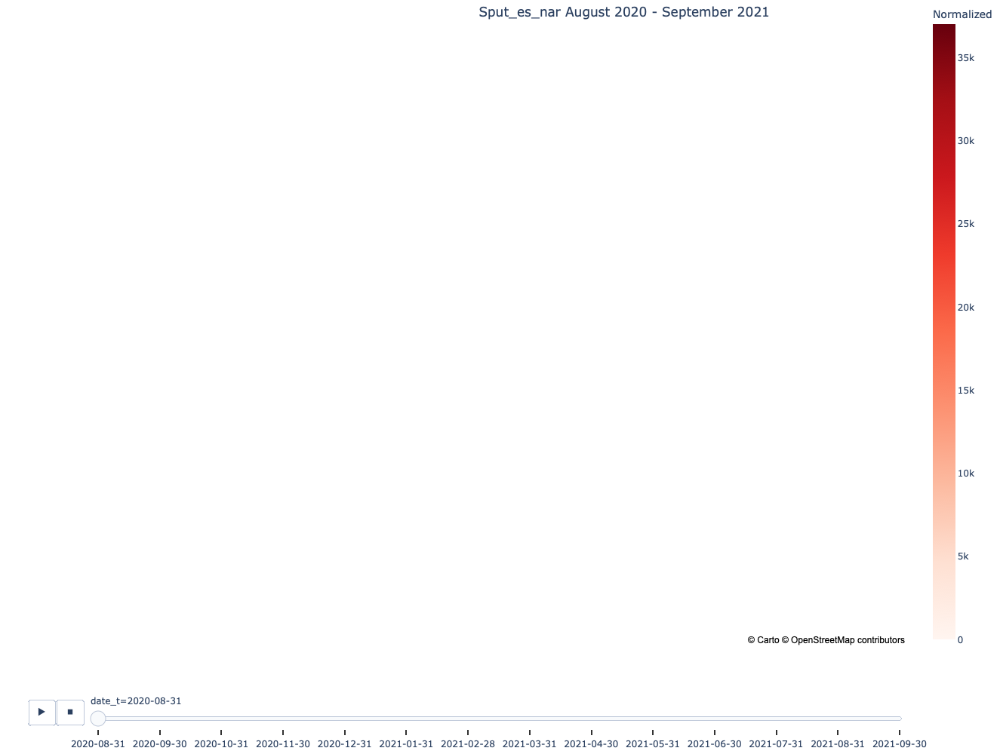

In [110]:
import plotly.express as px

fig = px.choropleth_mapbox(df_normal_map_es_nar, geojson=mp_1, locations='iso_a3', color='normal',
                           color_continuous_scale="reds",
                           #range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=1.75, center = {"lat": 10, "lon": -80},
                           labels={'normal':'Normalized'},
                           range_color=(0,37000),
                           animation_frame="date_t",
                           featureidkey="properties.iso_a3"
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                 autosize=False,
                 width=600,
                 height=1000,
                  title = {
                    'text': 'Sput_es_nar August 2020 - September 2021',
                    'y':0.99,
                    'x':0.77,
                    'xanchor': 'right',
                    'yanchor': 'top'}
                 )

#fig.update_layout(margin=dict(l=20, r=300, t=20, b=200),paper_bgcolor="LightSteelBlue")
fig.show()
fig.write_html("sput_es_nar_normal_N_S_america.html")

In [111]:
df_normal_map_es_NAR_mean = df_normal_map_es_nar.groupby(['country'])['normal'].mean().reset_index()

print(df_normal_map_es_NAR_mean) 

               country        normal
0            Argentina   6947.842857
1              Bolivia   2353.773585
2               Brazil    126.393298
3               Canada     33.509615
4                Chile    496.253968
5             Colombia    713.390192
6           Costa Rica    199.309940
7   Dominican Republic    189.313616
8              Ecuador   1584.409938
9          El Salvador    431.986340
10           Guatemala   2265.183420
11            Honduras   2252.962218
12              Mexico   1045.798701
13           Nicaragua   4407.248157
14              Panama    361.523319
15            Paraguay   4965.497949
16                Peru    910.092166
17       United States    706.344053
18             Uruguay   1833.420868
19           Venezuela  12781.851852


In [112]:
df_normal_map_es_NAR_mean.describe()

,normal
count,20.000000
mean,2230.305303
std,3090.290498
min,33.509615
25%,414.370585
50%,977.945434
75%,2287.330961
max,12781.851852


In [113]:
# Builds ISO codes for countries in the data set
list_countries = df_normal_map_es_NAR_mean['country'].unique().tolist()
print(list_countries) # Uncomment to see list of countries
d_country_code = {}  # To hold the country names and their ISO
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)
        # If could not find country, make ISO code ' '
        d_country_code.update({country: ' '})

print(d_country_code) # Uncomment to check dictionary  

['Argentina', 'Bolivia', 'Brazil', 'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Dominican Republic', 'Ecuador', 'El Salvador', 'Guatemala', 'Honduras', 'Mexico', 'Nicaragua', 'Panama', 'Paraguay', 'Peru', 'United States', 'Uruguay', 'Venezuela']
{'Argentina': 'ARG', 'Bolivia': 'BOL', 'Brazil': 'BRA', 'Canada': 'CAN', 'Chile': 'CHL', 'Colombia': 'COL', 'Costa Rica': 'CRI', 'Dominican Republic': 'DOM', 'Ecuador': 'ECU', 'El Salvador': 'SLV', 'Guatemala': 'GTM', 'Honduras': 'HND', 'Mexico': 'MEX', 'Nicaragua': 'NIC', 'Panama': 'PAN', 'Paraguay': 'PRY', 'Peru': 'PER', 'United States': 'USA', 'Uruguay': 'URY', 'Venezuela': 'VEN'}


In [114]:
# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code.items():
     df_normal_map_es_NAR_mean.loc[( df_normal_map_es_NAR_mean.country == k), 'iso_a3'] = v

df_normal_map_es_NAR_mean.info()  # Uncomment to confirm that ISO codes added

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   country  20 non-null     object 
 1   normal   20 non-null     float64
 2   iso_a3   20 non-null     object 
dtypes: float64(1), object(2)
memory usage: 608.0+ bytes


In [115]:
#Export the file to CSV
df_normal_map_es_NAR_mean.to_csv('sput_es_nar_normal_N_S_america_mean.csv')

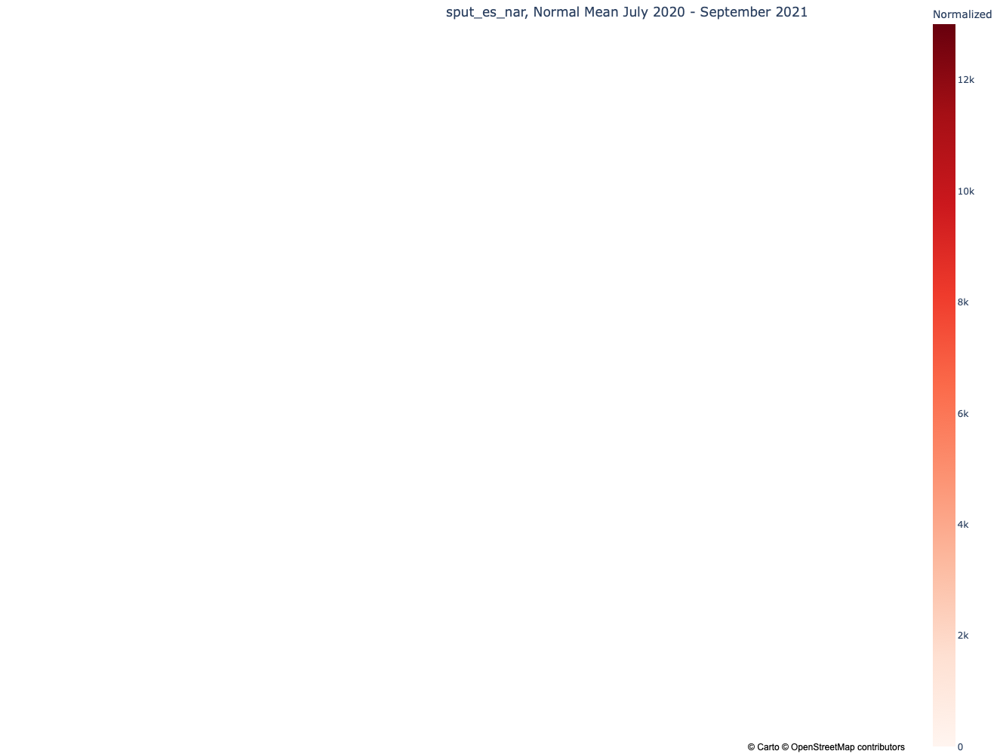

In [116]:
import plotly.express as px

fig = px.choropleth_mapbox(df_normal_map_es_NAR_mean, geojson=mp_1, locations='iso_a3', color='normal',
                           color_continuous_scale="reds",
                           #range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=1.75, center = {"lat": 10, "lon": -80},
                           labels={'normal':'Normalized'},
                           range_color=(0,13000),
                           #animation_frame="date_t",
                           featureidkey="properties.iso_a3"
                          )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                 autosize=False,
                 width=600,
                 height=1000,
                  title = {
                    'text': 'sput_es_nar, Normal Mean July 2020 - September 2021',
                    'y':0.99,
                    'x':0.81,
                    'xanchor': 'right',
                    'yanchor': 'top'}
                 )

#fig.update_layout(margin=dict(l=20, r=300, t=20, b=200),paper_bgcolor="LightSteelBlue")
fig.show()
fig.write_html("sput_es_nar_normal_N_S_america_mean.html")